In [1]:
%%time

# --- Install offline packages ---
try:
    import ace_tools_open
except ModuleNotFoundError:
    print('Installing ace tools...')
    !pip install -q /kaggle/input/offline-packages/itables-2.3.0-py3-none-any.whl
    !pip install -q /kaggle/input/offline-packages/ace_tools_open-0.1.0-py3-none-any.whl

try:
    import timm
except ModuleNotFoundError:
    print('Installing timm...')
    !pip install -q /kaggle/input/offline-packages/timm-1.0.15-py3-none-any.whl

# --- Core libraries ---
import os
import math
import random
import time
import tempfile
import numpy as np

# --- Data handling ---
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score
from dataclasses import dataclass, field

# --- PyTorch ---
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from torch.optim.lr_scheduler import CosineAnnealingLR

# --- Audio processing and torchaudio---
import torchaudio
import torchaudio.transforms as T
from torchaudio.functional import bandpass_biquad
from IPython.display import Audio, display

# --- Visualization ---
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import ace_tools_open as tools

# --- Parallel and Custom Tools ---
from joblib import Parallel, delayed
from torch.amp import GradScaler, autocast
from concurrent.futures import ProcessPoolExecutor, as_completed
from typing import Optional, List, Tuple
import timm
import gc

Installing ace tools...
CPU times: user 10.6 s, sys: 1.81 s, total: 12.4 s
Wall time: 23.4 s


In [2]:
# Set seed
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

device = 'cuda' if torch.cuda.is_available() else 'cpu'

### Define Paths

In [3]:
# Base path to dataset
data_path = '/kaggle/input/birdclef-2025/'

# Key file paths
metadata_path = os.path.join(data_path, 'train.csv')
taxonomy_path = os.path.join(data_path, 'taxonomy.csv')
location_path = os.path.join(data_path, 'recording_location.txt')

# Audio data directories
train_data_path = os.path.join(data_path, 'train_audio')
test_soundscapes_path = os.path.join(data_path, 'test_soundscapes')
unlabeled_soundscapes_path = os.path.join(data_path, 'train_soundscapes')

### Load Metadata

In [4]:
# Load training metadata
train_df = pd.read_csv(metadata_path)
print("Train CSV shape:", train_df.shape)
print(train_df.head(10))

Train CSV shape: (28564, 13)
  primary_label              secondary_labels                    type  \
0       1139490                          ['']                    ['']   
1       1139490                          ['']                    ['']   
2       1192948                          ['']                    ['']   
3       1192948                          ['']                    ['']   
4       1192948                          ['']                    ['']   
5       1192948                          ['']                    ['']   
6       1194042                          ['']                    ['']   
7       1194042                          ['']                    ['']   
8       1194042                          ['']                    ['']   
9        126247  ['65448', '22976', '476538']  ['advertisement call']   

               filename collection  rating  \
0  1139490/CSA36385.ogg        CSA     0.0   
1  1139490/CSA36389.ogg        CSA     0.0   
2  1192948/CSA36358.ogg      

In [5]:
# Load taxonomy info
taxonomy_df = pd.read_csv(taxonomy_path)
print("\nTaxonomy CSV shape:", taxonomy_df.shape)
print(taxonomy_df.head(1))


Taxonomy CSV shape: (206, 5)
  primary_label  inat_taxon_id       scientific_name           common_name  \
0       1139490        1139490  Ragoniella pulchella  Ragoniella pulchella   

  class_name  
0    Insecta  


In [6]:
# Load location info
with open(location_path, 'r') as f:
    location_info = f.read()

print("\nRecording Location Info:")
print(location_info)


Recording Location Info:
Nature reserve "El Silencio" in the municipality of Yondó in the Middle Magdalena Valley of Colombia.

Website: https://www.fundacionbiodiversa.org/fundacion2024/information/  

Coordinates:

Latitude: 6.76
Longitude: -74.21


### Basic Inspection of Training Data

In [7]:
# Unique species
print("\nNumber of unique primary labels (species):", train_df['primary_label'].nunique())

# Distribution of top 10 species
print("\nTop 10 most common species:")
print(train_df['primary_label'].value_counts().head(10))
print("...")
print("\nBottom 10 most common species:")
print(train_df['primary_label'].value_counts().tail(10))



Number of unique primary labels (species): 206

Top 10 most common species:
primary_label
grekis     990
compau     808
trokin     787
roahaw     709
banana     610
whtdov     572
socfly1    543
yeofly1    525
bobfly1    514
wbwwre1    499
Name: count, dtype: int64
...

Bottom 10 most common species:
primary_label
21038      2
41778      2
21116      2
64862      2
528041     2
476537     2
47067      2
42113      2
42087      2
1139490    2
Name: count, dtype: int64


As can be seen, the top 10 codes are different that what we saw in the first sample. That's because there are different codes, depending on the animal present and the dataset. There are 6 letters eBird code for birds and iNaturalist taxon ID for non-birds. Also, there are 206 unique labels, but for some of them, very little number of samples is present. For instance, sample 0, with primary label 1139490 is present just 2 times.

In [8]:
# Check for missing data
print("\nMissing values per column:")
print(train_df.isnull().sum())


Missing values per column:
primary_label         0
secondary_labels      0
type                  0
filename              0
collection            0
rating                0
url                   0
latitude            809
longitude           809
scientific_name       0
common_name           0
author                0
license               0
dtype: int64


Since it's unlikely that we are gonna use latitude and longitude for now, there is no missing data. Let's analyze the rating and collection columns, to see how many sample come from which collection and what's their rating.

In [9]:
print(train_df['collection'].value_counts())

collection
XC      21204
iNat     7198
CSA       162
Name: count, dtype: int64


In [10]:
print(train_df.groupby(['collection', 'rating']).size())

collection  rating
CSA         0.0        162
XC          0.0        588
            0.5         26
            1.0        228
            1.5         70
            2.0        752
            2.5        360
            3.0       2886
            3.5        895
            4.0       7582
            4.5       1261
            5.0       6556
iNat        0.0       7198
dtype: int64


### Load and Inspect Sample Audio Files with Torchaudio


Sample Rate: 32000
Waveform shape: torch.Size([1, 3089984])
Collection: CSA


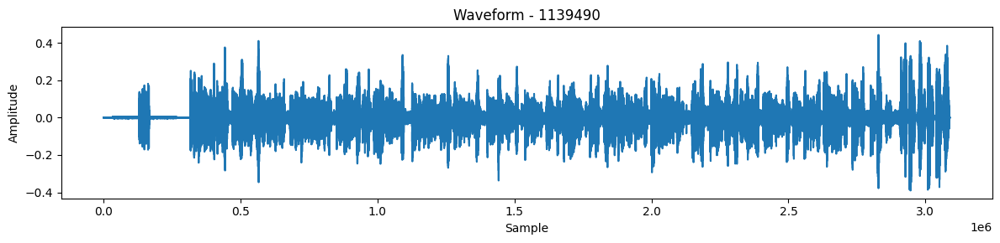

In [11]:
# Pick a sample
sample_row = train_df.iloc[1]
sample_path = os.path.join(train_data_path, sample_row['filename'])

# Load audio
waveform, sample_rate = torchaudio.load(sample_path)
print(f"\nSample Rate: {sample_rate}")
print(f"Waveform shape: {waveform.shape}")  # Shape: [1, num_samples]
print(f"Collection: {sample_row['collection']}")

# Listen to the audio
display(Audio(waveform.numpy()[0], rate=sample_rate))

# Plot waveform
plt.figure(figsize=(12, 3))
plt.plot(waveform.numpy()[0])
plt.title(f"Waveform - {sample_row['primary_label']}")
plt.xlabel("Sample")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()


As we can listen from the audio, no animals are present. Just the speaker's voice can be heard. The collection is CSA and the animal is one of those present in just 2 training files. Let's create a function to listen to specific audio files. The following function will sample an audio file from the training set. One can choose to sample by collection, rating or name.

In [12]:
def get_audio_sample(
    df, 
    audio_dir, 
    collection=None, 
    rating=None, 
    primary_label=None, 
    common_name=None, 
    random_sample=True
):
    # Step 1: Filter the dataframe
    filtered = df.copy()
    
    if collection:
        filtered = filtered[filtered['collection'] == collection]
    if rating is not None:
        filtered = filtered[filtered['rating'] == rating]
    if primary_label:
        filtered = filtered[filtered['primary_label'] == primary_label]
    if common_name:
        filtered = filtered[filtered['common_name'].str.contains(common_name, case=False, na=False)]

    # Step 2: Select sample
    if filtered.empty:
        print("No matches found with the given filters.")
        return
    sample = filtered.sample(1) if random_sample else filtered.iloc[[0]]
    row = sample.iloc[0]
    
    # Step 3: Load and play
    path = os.path.join(audio_dir, row['filename'])
    print(f"▶️ Playing: {row['common_name']} [{row['primary_label']}]")
    print(f"Collection: {row['collection']}, Rating: {row['rating']}")
    print(f"File: {row['filename']}")
    display(Audio(path))

    return sample  # return metadata for inspection

get_audio_sample(train_df, train_data_path, collection='iNat')

▶️ Playing: Streaked Flycatcher [strfly1]
Collection: iNat, Rating: 0.0
File: strfly1/iNat1205957.ogg


,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
21775,strfly1,[''],[''],strfly1/iNat1205957.ogg,iNat,0.0,https://static.inaturalist.org/sounds/1205957.wav,-22.4335,-43.1593,Myiodynastes maculatus,Streaked Flycatcher,Unknown,cc-by-nc 4.0


In [13]:
get_audio_sample(train_df, train_data_path, collection='XC', rating=0.5)

▶️ Playing: White-winged Swallow [whwswa1]
Collection: XC, Rating: 0.5
File: whwswa1/XC943004.ogg


,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
26044,whwswa1,['trokin'],['flight call'],whwswa1/XC943004.ogg,XC,0.5,https://xeno-canto.org/943004,4.3127,-74.7746,Tachycineta albiventer,White-winged Swallow,Myornis,cc-by-nc-sa 4.0


In [14]:
get_audio_sample(train_df, train_data_path, collection='CSA')

▶️ Playing: True Crickets [52884]
Collection: CSA, Rating: 0.0
File: 52884/CSA18980.ogg


,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
587,52884,[''],[''],52884/CSA18980.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,6.0776,-74.2145,Gryllidae,True Crickets,Alexandra Buitrago-Cardona,cc-by-nc-sa 4.0


In [15]:
get_audio_sample(train_df, train_data_path, common_name='tinamou')

▶️ Playing: Great Tinamou [gretin1]
Collection: XC, Rating: 4.0
File: gretin1/XC129845.ogg


,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
11476,gretin1,[''],['song'],gretin1/XC129845.ogg,XC,4.0,https://xeno-canto.org/129845,-9.5981,-55.932,Tinamus major,Great Tinamou,Eric DeFonso,cc-by-nc-sa 3.0


In [16]:
get_audio_sample(train_df, train_data_path, primary_label='grekis')

▶️ Playing: Great Kiskadee [grekis]
Collection: iNat, Rating: 0.0
File: grekis/iNat637071.ogg


,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
11257,grekis,[''],[''],grekis/iNat637071.ogg,iNat,0.0,https://static.inaturalist.org/sounds/637071.wav,27.7911,-97.3996,Pitangus sulphuratus,Great Kiskadee,Jon McIntyre,cc-by-nc 4.0


In [17]:
get_audio_sample(train_df, train_data_path, collection='XC', rating=0)

▶️ Playing: Yellow-headed Caracara [yehcar1]
Collection: XC, Rating: 0.0
File: yehcar1/XC157349.ogg


,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
27331,yehcar1,[''],['song'],yehcar1/XC157349.ogg,XC,0.0,https://xeno-canto.org/157349,6.1411,-75.6167,Milvago chimachima,Yellow-headed Caracara,Danny Zapata-Henao,cc-by-nc-sa 3.0



Average duration per collection:
collection
CSA     159.653097
XC       38.234362
iNat     22.311863
Name: duration_sec, dtype: float64


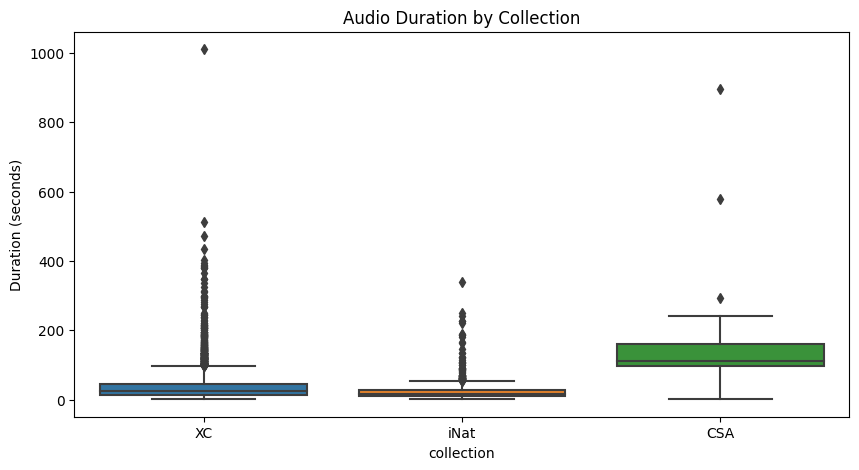

In [18]:
def compute_clip_durations(df, audio_dir, max_samples=5000):
    durations = []
    collections = []
    filenames = []

    # Limit for speed
    for idx, row in df.sample(min(max_samples, len(df))).iterrows():
        try:
            path = os.path.join(audio_dir, row['filename'])
            info = torchaudio.info(path)
            durations.append(info.num_frames / info.sample_rate)
            collections.append(row['collection'])
            filenames.append(row['filename'])
        except:
            durations.append(None)
            collections.append(row['collection'])
            filenames.append(row['filename'])

    return pd.DataFrame({'filename': filenames, 'collection': collections, 'duration_sec': durations})

duration_df = compute_clip_durations(train_df, train_data_path)

# Mean duration by collection
print("\nAverage duration per collection:")
print(duration_df.groupby("collection")["duration_sec"].mean())

plt.figure(figsize=(10, 5))
sns.boxplot(x="collection", y="duration_sec", data=duration_df)
plt.title("Audio Duration by Collection")
plt.ylabel("Duration (seconds)")
plt.show()


In [19]:
xc_df = train_df[train_df["collection"] == "XC"]

# Average rating per species (most common only)
rating_stats = xc_df.groupby("common_name")["rating"].agg(["mean", "count"]).sort_values("count", ascending=True)
print(rating_stats.head(10))


                             mean  count
common_name                             
Panama Humming Frog           4.5      1
Neotropical River Otter       4.0      1
Red-tailed Squirrel           5.0      1
Emerald Glass Frog            4.0      1
Savage's Thin-toed Frog       5.0      1
Spotted Foam-nest Frog        3.5      1
Tatayo's Glass Frog           4.0      1
Vaillant's Frog               5.0      1
Colombian Red Howler Monkey   4.0      1
Giant Toad                    5.0      2


In [33]:
def species_rating_report(df):
    species_group = df.groupby("primary_label").agg(
        total_count=("filename", "count"),
        high_quality_count=("rating", lambda x: (x > 2.5).sum()),
        no_rating_count=("rating", lambda x: (x == 0).sum()),
        # avg_rating=("rating", lambda x: x[x > 0].mean())
    )
    species_group["high_quality_ratio"] = species_group["high_quality_count"] / species_group["total_count"]
    return species_group.sort_values("high_quality_ratio", ascending=True)

species_quality = species_rating_report(train_df)
species_quality.head(50)


,total_count,high_quality_count,no_rating_count,high_quality_ratio
primary_label,,,,
1139490,2,0,2,0.000000
42087,2,0,2,0.000000
42113,2,0,2,0.000000
714022,5,0,5,0.000000
476537,2,0,2,0.000000
48124,20,0,20,0.000000
50186,30,0,30,0.000000
523060,4,0,4,0.000000
528041,2,0,2,0.000000


Let's analyze the taxonomy of the dataset. We need to understand the distribution of the various classes first.

In [22]:
# Plot
def bar_plot(data, x, y, palette, xl, yl, title,f):
    plt.figure(figsize=f)
    sns.barplot(data=data, x=x, y=y, palette=palette)
    plt.title(title)
    plt.ylabel(yl)
    plt.xlabel(xl)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()
    
def pie_chart(data, labels, palette, title, f):
    plt.figure(figsize=f)
    plt.pie(data, labels=labels,
            autopct='%1.1f%%', startangle=140, colors=sns.color_palette(palette))
    plt.title(title)
    plt.tight_layout()
    plt.show()


🔢 Sample count per taxonomic class:
  class_name  num_species
0       Aves        27648
1   Amphibia          583
2   Mammalia          178
3    Insecta          155


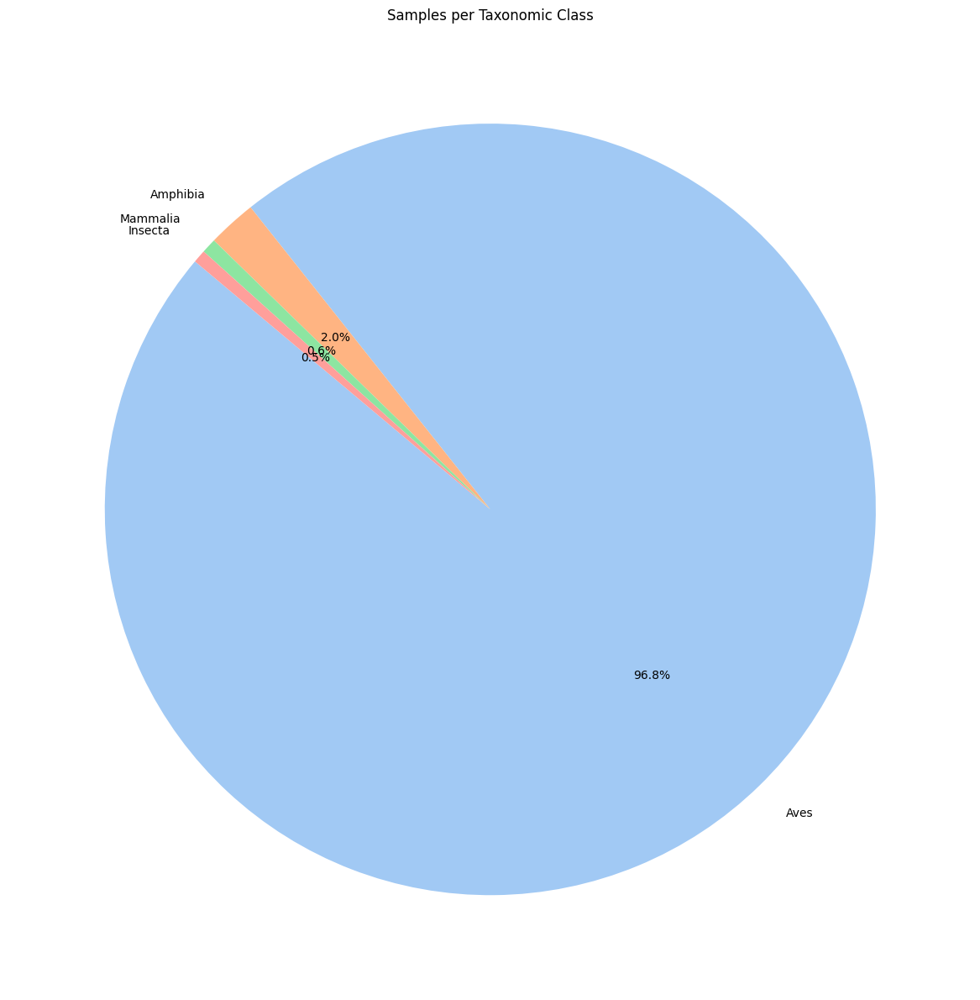

In [32]:
taxonomy_df = pd.read_csv(taxonomy_path)

# Join to attach class info (Aves, etc.)
train_with_class = train_df.merge(taxonomy_df[["primary_label", "class_name"]], on="primary_label", how="left")

# Group by class
class_counts = train_with_class["class_name"].value_counts().reset_index()
class_counts.columns = ["class_name", "num_species"]
print("\n🔢 Sample count per taxonomic class:")
print(class_counts)

pie_chart(class_counts["num_species"], labels=class_counts["class_name"], palette="pastel", title=f"Samples per Taxonomic Class", f=(12, 12))

In [22]:
print(train_with_class.groupby(['class_name', 'collection']).size())

class_name  collection
Amphibia    CSA               7
            XC              147
            iNat            429
Aves        XC            21040
            iNat           6608
Insecta     CSA             155
Mammalia    XC               17
            iNat            161
dtype: int64


Interestingly enough, `insects` are only present in the CSA collection, while `mammals` mainly in the iNat one. `amphibians` can be found everywhere while `birds` are present a lot more than the other classes, with a staggering 96.8% of presence.

In [23]:
# Count how many rows have at least one secondary label
# Determine if secondary_labels contain valid species
def has_real_secondary_labels(x):
    labels = eval(x)
    return any(label.strip() != '' for label in labels)

train_df["has_secondary"] = train_df["secondary_labels"].apply(has_real_secondary_labels)

# Count valid secondary label entries
secondary_count = train_df["has_secondary"].sum()
total_count = len(train_df)

print(f"\n🔁 Samples with valid secondary labels: {secondary_count} / {total_count} ({100 * secondary_count / total_count:.2f}%)")

sec_by_species = train_df.groupby("primary_label")["has_secondary"].sum().sort_values(ascending=False)
print("\n🎯 Top 10 species with the most secondary-label recordings:")
print(sec_by_species.head(10))



🔁 Samples with valid secondary labels: 2654 / 28564 (9.29%)

🎯 Top 10 species with the most secondary-label recordings:
primary_label
grekis     67
socfly1    65
trokin     64
roahaw     62
pirfly1    59
banana     58
sobtyr1    57
whtdov     57
bobfly1    55
yercac1    54
Name: has_secondary, dtype: int64


In [24]:
print(train_df.groupby(['has_secondary', 'collection']).size())

has_secondary  collection
False          CSA             162
               XC            18550
               iNat           7198
True           XC             2654
dtype: int64


Again, the only dataset with secondary labels is Xeno-canto, as expected. The others are not curated for multi-label annotations.

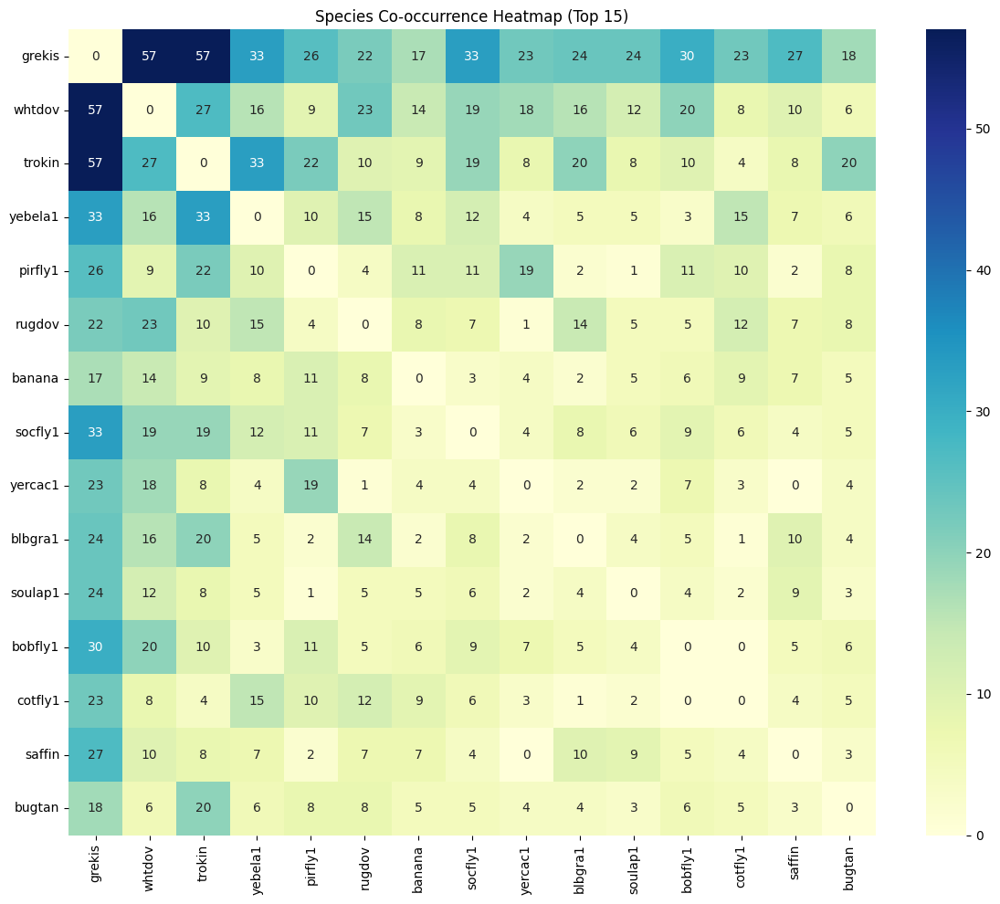

In [25]:
from collections import defaultdict
from sklearn.preprocessing import MultiLabelBinarizer

# Step 1: Parse all valid secondary labels into lists
def parse_secondary_labels(x):
    labels = eval(x)
    return [label for label in labels if label.strip() != '']

train_df["parsed_secondary"] = train_df["secondary_labels"].apply(parse_secondary_labels)

# Step 2: Build co-occurrence list of (primary + secondary) per sample
co_occurrence = []
for idx, row in train_df.iterrows():
    labels = [row["primary_label"]] + row["parsed_secondary"]
    if len(labels) > 1:
        co_occurrence.append(list(set(labels)))  # de-duplicate per sample

# Step 3: Convert to binary matrix
mlb = MultiLabelBinarizer()
binary_matrix = mlb.fit_transform(co_occurrence)
label_names = mlb.classes_

# Step 4: Compute co-occurrence counts
co_matrix = np.dot(binary_matrix.T, binary_matrix)
np.fill_diagonal(co_matrix, 0)  # remove self-counts

# Step 5: Convert to DataFrame
co_df = pd.DataFrame(co_matrix, index=label_names, columns=label_names)

# Step 6: Visualize most common co-occurrences (heatmap of top N)
top_n = 15
top_species = co_df.sum().sort_values(ascending=False).head(top_n).index
plt.figure(figsize=(12, 10))
sns.heatmap(co_df.loc[top_species, top_species], cmap="YlGnBu", annot=True, fmt="d")
plt.title("Species Co-occurrence Heatmap (Top 15)")
plt.tight_layout()
plt.show()


In [31]:
# Compute sample count per class
sample_counts = train_with_class["class_name"].value_counts().reset_index()
sample_counts.columns = ["class_name", "num_samples"]
    
#pie_chart(sample_counts["num_samples"], labels=sample_counts["class_name"], palette="pastel", title="Number of Audio Samples per Taxonomic Class", f=(6,6))
#bar_plot(sample_counts, x="class_name", y="num_samples", palette="pastel", xl="Taxonomic Class", yl="Number of Samples", title="Number of Audio Samples per Taxonomic Class", f=(8,5))

Unique species per class:
  class_name  num_species
0       Aves          146
1   Amphibia           34
2    Insecta           17
3   Mammalia            9


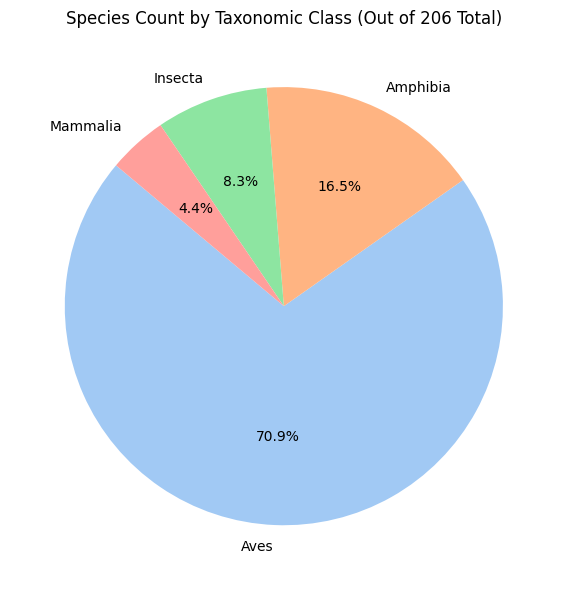

In [27]:
# Unique species per class from taxonomy
species_per_class = taxonomy_df["class_name"].value_counts().reset_index()
species_per_class.columns = ["class_name", "num_species"]

#bar_plot(species_per_class, x="class_name", y="num_species", palette="pastel", xl="Taxonomic Class", yl="Species Count", title="Number of Unique Species per Class", f=(8,5))
print("Unique species per class:")
print(species_per_class)

pie_chart(species_per_class["num_species"], labels=species_per_class["class_name"], palette="pastel", title=f"Species Count by Taxonomic Class (Out of {sum(species_per_class['num_species'])} Total)", f=(6,6))

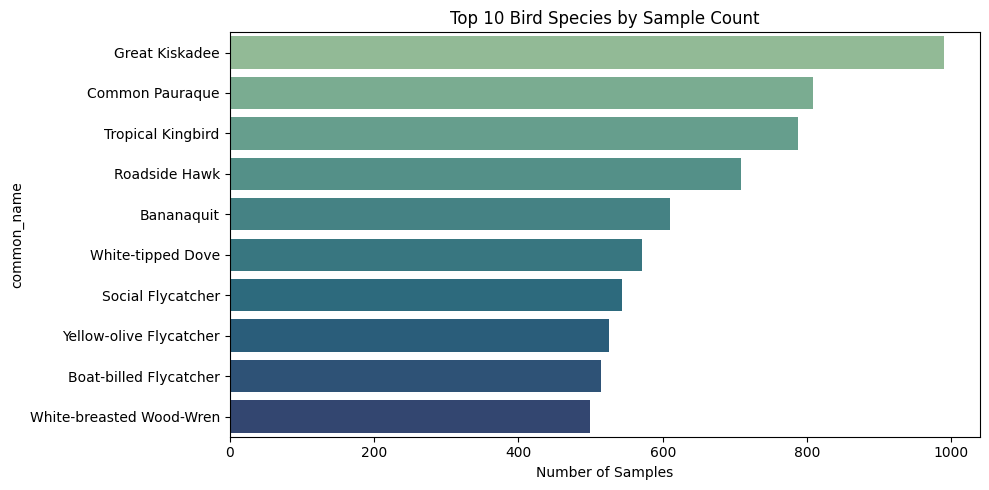

In [28]:
# Add class info to training data
train_with_class = train_df.merge(taxonomy_df[['primary_label', 'class_name']], on='primary_label', how='left')

# Filter to Aves
birds_df = train_with_class[train_with_class["class_name"] == "Aves"]

# Count samples per bird species
top_birds = birds_df["common_name"].value_counts().head(10)

# Plot
plt.figure(figsize=(10, 5))
sns.barplot(y=top_birds.index, x=top_birds.values, palette="crest")
plt.title("Top 10 Bird Species by Sample Count")
plt.xlabel("Number of Samples")
plt.tight_layout()
plt.show()


### Convert to Mel Spectrogram (Torchaudio)

In [29]:
def get_audio_sample(
    df, 
    audio_dir, 
    collection=None, 
    rating=None, 
    primary_label=None, 
    common_name=None, 
    filename=None,
    random_sample=True
):
    # Step 1: Filter the dataframe
    filtered = df.copy()
    
    if collection:
        filtered = filtered[filtered['collection'] == collection]
    if rating is not None:
        filtered = filtered[filtered['rating'] == rating]
    if primary_label:
        filtered = filtered[filtered['primary_label'] == primary_label]
    if filename:
        filtered = filtered[filtered['filename'] == filename]
    if common_name:
        filtered = filtered[filtered['common_name'].str.contains(common_name, case=False, na=False)]

    # Step 2: Select sample
    if filtered.empty:
        print("No matches found with the given filters.")
        return
    sample = filtered.sample(1) if random_sample else filtered.iloc[[0]]
    row = sample.iloc[0]
    
    # Step 3: Load and play
    path = os.path.join(audio_dir, row['filename'])
    print(f"▶️ Playing: {row['common_name']} [{row['primary_label']}]")
    print(f"Collection: {row['collection']}, Rating: {row['rating']}")
    print(f"File: {row['filename']}")
    display(Audio(path))

    return sample  # return metadata for inspection


# Load training metadata
train_df = pd.read_csv(metadata_path)
# --- Select random samples for testing ---
sample_files = random.sample(list(train_df.filename), 3)
print(f"[INFO] Selected samples: {sample_files}")

get_audio_sample(train_df, train_data_path, filename=sample_files[0])
get_audio_sample(train_df, train_data_path, filename=sample_files[1])
get_audio_sample(train_df, train_data_path, filename=sample_files[2])

[INFO] Selected samples: ['stbwoo2/XC584906.ogg', 'blbgra1/XC524139.ogg', '65448/iNat925724.ogg']
▶️ Playing: Straight-billed Woodcreeper [stbwoo2]
Collection: XC, Rating: 5.0
File: stbwoo2/XC584906.ogg


▶️ Playing: Blue-black Grassquit [blbgra1]
Collection: XC, Rating: 4.0
File: blbgra1/XC524139.ogg


▶️ Playing: Túngara Frog [65448]
Collection: iNat, Rating: 0.0
File: 65448/iNat925724.ogg


,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
819,65448,[''],[''],65448/iNat925724.ogg,iNat,0.0,https://static.inaturalist.org/sounds/925724.wav,9.481,-84.1409,Engystomops pustulosus,Túngara Frog,Dan MacNeal,cc-by 4.0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:704: UserWarning: A window was not provided. A rectangular window will be applied,which is known to cause spectral leakage. Other windows such as torch.hann_window or torch.hamming_window can are recommended to reduce spectral leakage.To suppress this warning and use a rectangular window, explicitly set `window=torch.ones(n_fft, device=<device>)`. (Triggered internally at ../aten/src/ATen/native/SpectralOps.cpp:836.)
  return _VF.stft(  # type: ignore[attr-defined]


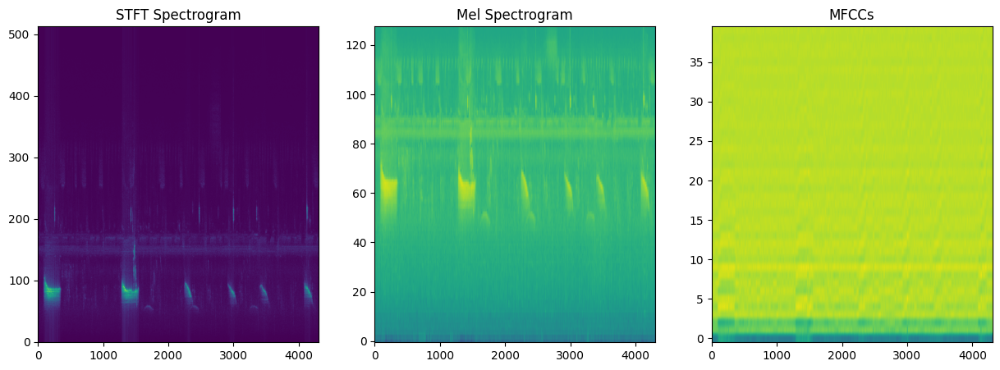

In [30]:
# Load an example audio file
f_name = f'/kaggle/input/birdclef-2025/train_audio/{sample_files[0]}' # sample_files[0]
waveform, sample_rate = torchaudio.load(f_name)

# STFT Spectrogram
stft = torch.stft(waveform[0], n_fft=1024, hop_length=512, return_complex=True)
stft_mag = stft.abs().numpy()

# Mel Spectrogram
mel_spec_transform = T.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=1024,
    hop_length=512,
    n_mels=128,
    f_min=50,
    f_max=14000
)
mel_spec = mel_spec_transform(waveform)

# MFCC
mfcc_transform = T.MFCC(
    sample_rate=sample_rate,
    n_mfcc=40,
    melkwargs={
        'n_fft': 1024,
        'hop_length': 512,
        'n_mels': 128,
        'f_min': 50,
        'f_max': 14000
    }
)
mfcc = mfcc_transform(waveform)

# Plotting
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(np.log1p(stft_mag), aspect='auto', origin='lower')
ax[0].set_title("STFT Spectrogram")
ax[1].imshow(mel_spec.log2()[0, :, :].numpy(), aspect='auto', origin='lower')
ax[1].set_title("Mel Spectrogram")
ax[2].imshow(mfcc[0, :, :].numpy(), aspect='auto', origin='lower')
ax[2].set_title("MFCCs")
plt.show()


In [31]:
# --- Configuration Parameters ---
N_FFT_VALUES = [512, 1024, 2048]
HOP_LENGTH_VALUES = [128, 256, 512]
N_MELS_VALUES = [64, 128, 256]
FMIN = 50
FMAX = 14000

# --- Function to Plot Mel Spectrogram ---
def plot_mel_spectrogram(mel_spec, sample_rate, title, ax):
    """
    Plots a Mel Spectrogram.
    
    Parameters:
    - mel_spec: The Mel Spectrogram tensor.
    - sample_rate: Sampling rate of the audio.
    - title: Title of the plot.
    - ax: Matplotlib axis to plot on.
    """
    mel_spec_db = T.AmplitudeToDB()(mel_spec)
    ax.imshow(mel_spec_db.squeeze().numpy(), cmap='viridis', origin='lower', aspect='auto')
    ax.set_title(title)
    ax.set_xlabel('Time (frames)')
    ax.set_ylabel('Frequency (mel)')
    plt.colorbar(ax.imshow(mel_spec_db.squeeze().numpy(), cmap='viridis', origin='lower', aspect='auto'), ax=ax)

# --- Function to Generate and Plot Spectrograms ---
def visualize_mel_spectrograms(file_path):
    """
    Visualizes the Mel Spectrograms for various hyperparameters.
    
    Parameters:
    - file_path: Path to the audio file.
    """
    # Load the audio file
    waveform, sample_rate = torchaudio.load(file_path)
    waveform = waveform.mean(dim=0, keepdim=True)  # Mono conversion if stereo

    #print(f"▶️ Playing Audio Sample: {file_path}")
    #ipd.display(ipd.Audio(waveform.numpy().flatten(), rate=sample_rate))

    # Plot configurations
    fig, axes = plt.subplots(len(N_FFT_VALUES), len(HOP_LENGTH_VALUES), figsize=(15, 10))
    fig.suptitle(f"Mel Spectrogram Comparison\nFile: {file_path}", fontsize=16)

    # Iterate over different hyperparameters
    for i, n_fft in enumerate(N_FFT_VALUES):
        for j, hop_length in enumerate(HOP_LENGTH_VALUES):
            mel_spectrogram = T.MelSpectrogram(
                sample_rate=sample_rate,
                n_fft=n_fft,
                hop_length=hop_length,
                n_mels=128,  # Keeping this constant for now
                f_min=FMIN,
                f_max=FMAX
            )(waveform)
            
            plot_mel_spectrogram(
                mel_spectrogram, 
                sample_rate, 
                f"n_fft={n_fft}, hop_length={hop_length}", 
                axes[i, j]
            )
    plt.tight_layout()
    plt.show()

    # Experiment with different mel bins (n_mels)
    fig, axes = plt.subplots(1, len(N_MELS_VALUES), figsize=(15, 5))
    fig.suptitle(f"Effect of Different Mel Bins\nFile: {file_path}", fontsize=16)
    
    for idx, n_mels in enumerate(N_MELS_VALUES):
        mel_spectrogram = T.MelSpectrogram(
            sample_rate=sample_rate,
            n_fft=1024,
            hop_length=256,
            n_mels=n_mels,
            f_min=FMIN,
            f_max=FMAX
        )(waveform)
        
        plot_mel_spectrogram(
            mel_spectrogram, 
            sample_rate, 
            f"n_mels={n_mels}", 
            axes[idx]
        )
    
    plt.tight_layout()
    plt.show()


▶️ Playing: Gray-cowled Wood-Rail [gycwor1]
Collection: XC, Rating: 4.5
File: gycwor1/XC278669.ogg


/usr/local/lib/python3.11/dist-packages/torchaudio/functional/functional.py:584: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (257) may be set too low.
  warnings.warn(


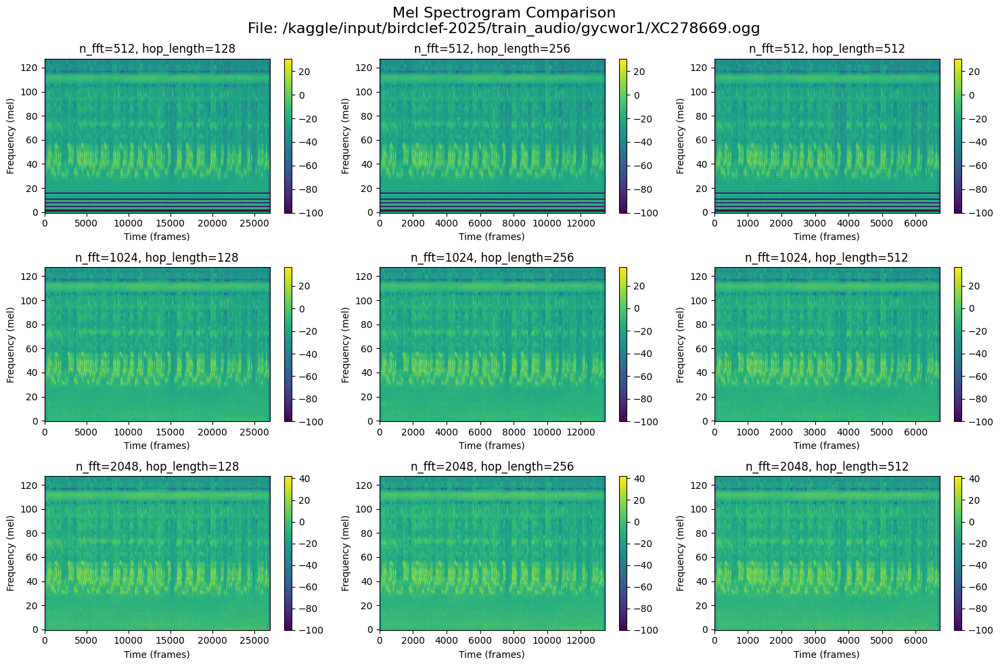

/usr/local/lib/python3.11/dist-packages/torchaudio/functional/functional.py:584: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (256) may be set too high. Or, the value for `n_freqs` (513) may be set too low.
  warnings.warn(


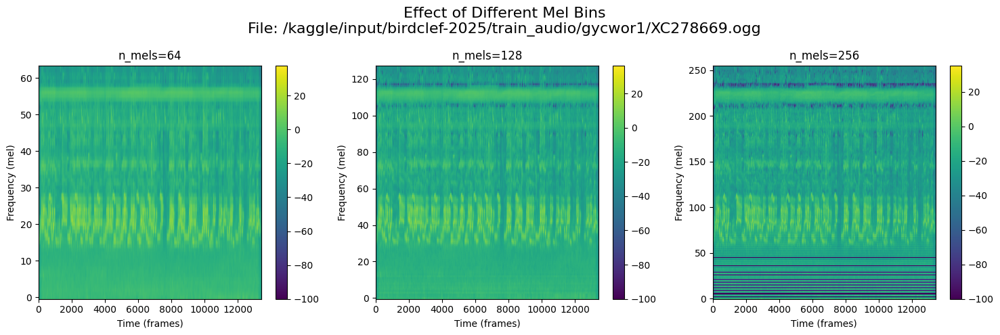

In [32]:
sample = get_audio_sample(train_df, train_data_path, collection='XC', rating=4.5)
file_path = os.path.join(train_data_path, sample.iloc[0]['filename'])
visualize_mel_spectrograms(file_path)


▶️ Playing: Lineated Woodpecker [linwoo1]
Collection: XC, Rating: 4.0
File: linwoo1/XC812907.ogg


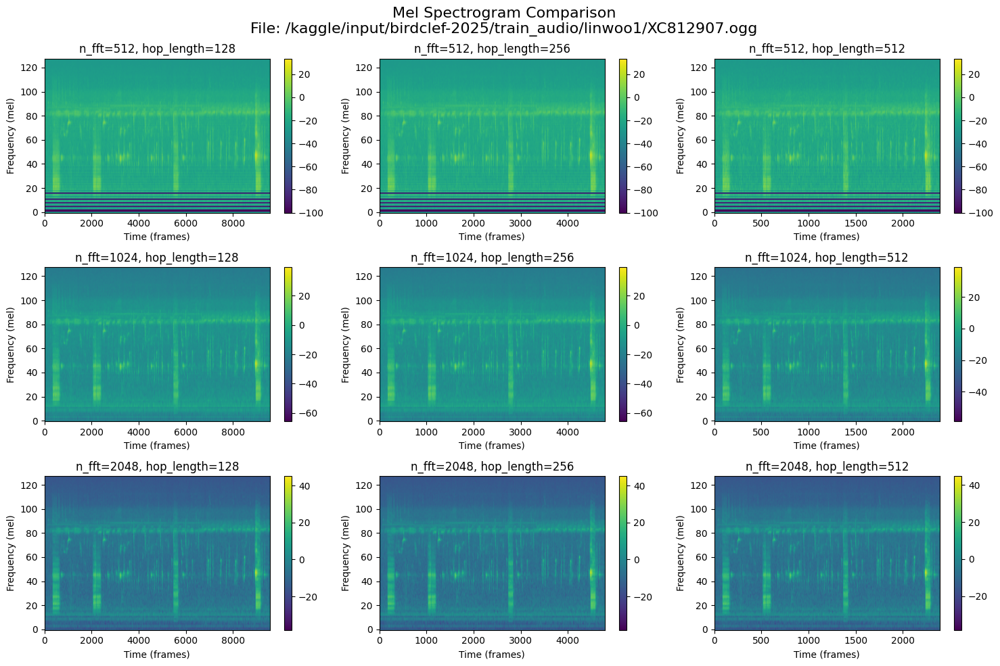

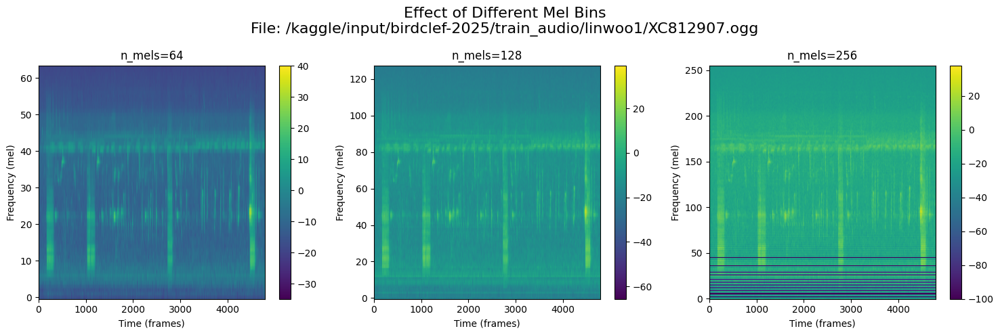

In [33]:
sample = get_audio_sample(train_df, train_data_path, collection='XC', rating=4)
file_path = os.path.join(train_data_path, sample.iloc[0]['filename'])
visualize_mel_spectrograms(file_path)

## Configuration parameters

In [39]:
@dataclass
class CFG:
    # General
    seed: int = 69
    debug: bool = False
    device: str = 'cuda' if torch.cuda.is_available() else 'cpu'
    print_freq: int = 100
    num_workers: int = 4
    OUTPUT_DIR: str = '/kaggle/working/'
    temporary_dir: str = field(init=False)
    spectogram_dir: str = field(init=False)
    METADATA_path: str = "spec_metadata.csv"

    ## Data paths ##
    # Base path to dataset
    data_path: str = '/kaggle/input/birdclef-2025/'
    # Key file paths
    metadata_path: str = field(init=False)
    taxonomy_path: str = field(init=False)
    sample_submission_path: str = field(init=False)
    location_path: str = field(init=False)
    # Audio data directories
    train_data_path: str = field(init=False)
    test_soundscapes_path: str = field(init=False)
    unlabeled_soundscapes_path: str = field(init=False)

    # Audio config
    topDB: int = 80
    FS: int = 32000
    CHUNK_LENGTH: float = 5.0   # seconds
    N_FFT: int = 1024
    HOP_LENGTH: int = 512  # 64
    N_MELS: int = 128
    FMIN: int = 50
    FMAX: int = 16000
    POWER: int = 2
    SPEC_DTYPE: str = 'float16'  # for disk saving
    
    # VAD and Filtering
    VAD_ENABLED: bool = True  # Whether to apply Voice Activity Detection
    VAD_THRESHOLD: float = 0.4  # Confidence threshold for Silero VAD
    BANDPASS_LOW: int = 300
    BANDPASS_HIGH: int = 16000
    VISUALIZE_SKIPPED: bool = False  # Set to True to see spectrograms of skipped chunks

    # Silence detection settings
    window_size: int = 512             # Small window size to evaluate silence
    silence_threshold: float = 1e-4      # RMS threshold for silence (lower means stricter)
    silent_duration_ratio: float = 0.80  # 75% of the chunk must be silent to discard

    # Training
    BATCH_SIZE: int = 32
    EPOCHS: int = 5
    criterion: str = 'BCEWithLogitsLoss'
    optimizer: str = 'AdamW'
    LEARNING_RATE: float = 1e-3
    weight_decay: float = 1e-5
    scheduler: str = 'CosineAnnealingLR'
    min_lr: float = 1e-6
    n_fold: int = 5

    # Augmentation
    augment = True
    aug_prob: float = 0.5
    mixup_alpha: float = 0.4

    # Model
    model_name: str = "efficientnet_b0" # 'efficientnet_b3_pruned', 'efficientnetv2_rw_m', 'efficientvit_l1', 'efficientvit_l2', 'efficientvit_m0'
    pretrained: bool = False
    in_channels: int = 1
    input_directory: str = '/kaggle/input/offline-packages'
    input_model_filename: str = field(init=False)
    output_model_filename: str = field(init=False)
    model_weights: str = field(init=False)
    num_classes: str = field(init=False)

    def __post_init__(self):
        self.metadata_path = os.path.join(self.data_path, 'train.csv')
        self.taxonomy_path = os.path.join(self.data_path, 'taxonomy.csv')
        self.sample_submission_path = os.path.join(self.data_path, 'sample_submission.csv')
        self.location_path = os.path.join(self.data_path, 'recording_location.txt')
        self.train_data_path = os.path.join(self.data_path, 'train_audio')
        self.test_soundscapes_path = os.path.join(self.data_path, 'test_soundscapes')
        self.unlabeled_soundscapes_path = os.path.join(self.data_path, 'train_soundscapes')
        
        self.input_model_filename = f'{self.model_name}_pretrained.pth'
        self.model_weights = os.path.join(self.input_directory, self.input_model_filename)
        self.output_model_filename = f'{self.model_name}_sed.pth'
        self.num_classes = len(pd.read_csv(self.taxonomy_path))

        
        self.temporary_dir = tempfile.TemporaryDirectory().name
        self.spectogram_dir = os.path.join(self.OUTPUT_DIR, 'precomputed_spectograms')
        if self.debug:
            self.EPOCHS = 2
            print("⚠️ Debug mode is ON. Training only for 2 epochs.")

cfg = CFG()

In [35]:
# Global variable for the VAD model (accessible in each worker)
global_vad_model = None
global_get_speech_timestamps = None

def initialize_vad_model():
    """
    Initializes the VAD model and assigns it to the global scope.
    This runs once per process.
    """
    global global_vad_model, global_get_speech_timestamps
    torch.set_num_threads(1)  # Avoid PyTorch oversubscription

    # Load the model
    global_vad_model, (global_get_speech_timestamps, _, _, _, _) = torch.hub.load(
        repo_or_dir='snakers4/silero-vad', 
        model='silero_vad',
        trust_repo=True
    )
    print("[INFO] Silero VAD model loaded successfully in worker process.")

class SpectrogramPreprocessor:
    """
    Converts audio files into log-mel spectrograms and saves them as .npy files.
    
    Supports:
    - Silero VAD for speech detection (via torch.hub)
    - 5-second chunking
    - Band-pass filtering
    - Parallel processing

    Methods:
    --------
    preprocess_file(filename) → Optional[List[Tuple[str, int]]]
        Process, chunk, and save spectrograms from a single audio file.
    preprocess_all_files(file_list) → List[Tuple[str, int]]
        Preprocess all files in parallel.
    """

    def __init__(self, cfg, num_workers = None):
        self.cfg = cfg
        self.sample_rate = cfg.FS
        self.chunk_samples = int(cfg.CHUNK_LENGTH * cfg.FS)
        os.makedirs(cfg.spectogram_dir, exist_ok=True)

        # Torchaudio transforms
        self.mel_transform = T.MelSpectrogram(
            sample_rate=cfg.FS,
            n_fft=cfg.N_FFT,
            hop_length=cfg.HOP_LENGTH,
            n_mels=cfg.N_MELS,
            f_min=cfg.FMIN,
            f_max=cfg.FMAX,
            power=cfg.POWER
        )
        self.db_transform = T.AmplitudeToDB(top_db=cfg.topDB)

        num_workers = num_workers if num_workers is not None else cfg.num_workers
        if cfg.VAD_ENABLED and num_workers == 1:
            initialize_vad_model()

    def preprocess_file(self, filename: str, rating: float) -> Optional[List[Tuple[str, int]]]:
        """
        Preprocess an audio file into multiple 5-second log-mel spectrograms.
        
        Parameters:
        -----------
        filename : str
            Path to the audio file relative to the training directory.

        Returns:
        --------
        list of tuples or None:
            [(chunk_filename, num_frames), ...] if successful, else None.
        """
        file_path = os.path.join(self.cfg.train_data_path, filename)
        if self.cfg.debug:
            print(filename)
        try:
            # Load the waveform and split into 5-second chunks
            waveform = self._load_and_prepare_waveform(file_path)
            chunks = self._split_into_chunks(waveform)
            
            # If it's XC, apply filtering and random sampling
            if self._is_collection_xc(filename):
                if rating >= 3:
                    sample_size = 3
                elif 1 <= rating < 3:
                    sample_size = 2
                else:
                    sample_size = 1
    
                # Randomly sample chunks if there are more than the allowed size
                if len(chunks) > sample_size:
                    selected_indices = sorted(random.sample(range(len(chunks)), sample_size))
                    chunks = [chunks[i] for i in selected_indices]
                else:
                    selected_indices = list(range(len(chunks)))
            else:
                # If not XC, keep all chunks and use their indices
                selected_indices = list(range(len(chunks)))
            
            # Initialize list for processed data
            processed = []
    
            # Loop through the selected chunks and save spectrograms
            for real_idx, chunk in zip(selected_indices, chunks):
                
                # Apply VAD only if enabled
                if self.cfg.VAD_ENABLED:
                    is_CSA = self._is_collection_csa(filename) 
                    if self._contains_human_voice(chunk, is_CSA = is_CSA):
                        if self.cfg.VISUALIZE_SKIPPED:
                            self._visualize_spectrogram(chunk, title=f"Skipped Chunk ending in {idx}")
                        continue  # Skip chunks with human voice
                    
                spec = self._waveform_to_spec(chunk)
                chunk_filename = f"{filename[:-4]}_chunk_{real_idx}.npy"
                primary = str(filename[:-4].split('/')[0])
                self._save_spectrogram(spec, chunk_filename)

                # Store chunk filename, num frames, and source filename
                processed.append((chunk_filename, spec.shape[-1], primary))

            return processed if processed else None
        except Exception as e:
            if self.cfg.debug:
                print(f"[ERROR] Failed to process {filename}: {e}")
            return None

    def _load_and_prepare_waveform(self, path: str) -> torch.Tensor:
        """
        Load audio, convert to mono, crop/pad to fixed length.

        Returns:
        --------
        waveform : Tensor [1, T]
        """
        waveform, sr = torchaudio.load(path)  # (channels, samples) = (2, 32000)
        if waveform.shape[0] > 1:
            # average the two channels and add a channel dimension back
            waveform = waveform.mean(dim=0, keepdim=True)  # convert to mono

        # Bandpass filter for noise removal
        #waveform = bandpass_biquad(waveform, self.sample_rate, self.cfg.BANDPASS_LOW, self.cfg.BANDPASS_HIGH)
        # Truncate to max allowed duration
        #max_samples = self.sample_rate * self.cfg.AUDIO_MAX_LEN
        #waveform = waveform[..., :max_samples]

        return waveform

    def _waveform_to_spec(self, waveform: torch.Tensor) -> torch.Tensor:
        """
        Convert waveform to normalized log-mel spectrogram.
        
        Returns:
        --------
        spec : Tensor [M, T]
        """
        mel = self.mel_transform(waveform)
        log_mel = self.db_transform(mel)
        norm_spec = (log_mel - log_mel.mean()) / (log_mel.std() + 1e-6)
        return norm_spec.squeeze(0).cpu()  # shape [M, T]

    def _split_into_chunks(self, waveform: torch.Tensor) -> List[torch.Tensor]:
        """
        Splits the waveform into 5-second chunks.
        
        Returns:
        --------
        list of Tensors:
            Each tensor represents 5 seconds of audio.
        """
        total_samples = waveform.shape[-1]
        chunks = []

        for start in range(0, total_samples, self.chunk_samples):
            end = start + self.chunk_samples
            chunk = waveform[..., start:end]
            
            # Apply logic for padding
            if self._should_pad_chunk(chunk, start, total_samples):
                pad_size = self.chunk_samples - chunk.shape[-1]
                chunk = F.pad(chunk, (0, pad_size))
                if self.cfg.debug:
                    print(f"[INFO] Padded chunk of {pad_size} to {self.chunk_samples} samples")
            elif chunk.shape[-1] < self.chunk_samples:
                if self.cfg.debug:
                    print(f"[INFO] Skipping under-sized chunk: {chunk.shape[-1]} samples")
                continue
            
            # Check for silence
            if self._is_mostly_silent(chunk):
                if self.cfg.debug:
                    print("[INFO] Skipped silent chunk.")
                continue
                
            chunks.append(chunk)
        return chunks
        
    def _is_mostly_silent(self, chunk: torch.Tensor) -> bool:
        """
        Checks if the chunk is mostly silent (75% of its duration).
        
        Parameters:
        -----------
        chunk : torch.Tensor
            The waveform chunk to evaluate.

        Returns:
        --------
        bool:
            True if mostly silent, False otherwise.
        """
        # Compute RMS in small windows
        windows = chunk.unfold(1, self.cfg.window_size, self.cfg.window_size)
        rms = windows.pow(2).mean(dim=-1).sqrt()

        # Count how many windows are below the silence threshold
        num_silent_windows = (rms < self.cfg.silence_threshold).sum().item()
        total_windows = rms.size(1)

        # If the ratio of silent windows is greater than the threshold, it's mostly silent
        return num_silent_windows / total_windows >= self.cfg.silent_duration_ratio

    def _save_spectrogram(self, spec: torch.Tensor, filename: str):
        """
        Save the spectrogram as a .npy file.

        Parameters:
        -----------
        spec : torch.Tensor
            The normalized spectrogram tensor [M, T]
        filename : str
            Original filename, used to derive save path
        """
        save_path = os.path.join(self.cfg.spectogram_dir, filename)
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        np.save(save_path, spec.numpy().astype(self.cfg.SPEC_DTYPE))

    def preprocess_all_files(self, file_list: List[str]) -> List[Tuple[str, int]]:
        """
        Runs preprocessing for all files in parallel.

        Parameters:
        -----------
        file_list : List[str]
            List of filenames to process.

        Returns:
        --------
        List of tuples (chunk_filename, num_frames).
        """
        print(f"[INFO] Parallel processing {len(file_list)} files...")
        
        if self.cfg.VAD_ENABLED:
            print(f"[INFO] Voice Activity Detection enabled, filtering human voice and silence...")
            results = self.run_in_parallel_with_VAD_enabled(file_list)
        else:
            print(f"[INFO] Voice Activity Detection NOT enabled, no filtering...")
            results = self.run_in_parallel_no_VAD(file_list)
        
        print("[INFO] Pre-processing complete!")
        results_df = self._create_and_save_csv(results)
        return results_df

    def _create_and_save_csv(self, metadata):
        # Create a DataFrame from metadata
        spec_df = pd.DataFrame(metadata, columns=["filename", "num_frames", "primary_label"])
        
        # Display and save
        tools.display_dataframe_to_user(name="Spectrogram Metadata with Labels", dataframe=spec_df)
        spec_df.to_csv(os.path.join(cfg.OUTPUT_DIR, "spec_metadata.csv"), index=False)

    def run_in_parallel_with_VAD_enabled(self, file_list: List[str]) -> List[Tuple[str, int]]:
         # Use ProcessPoolExecutor with initializer
        results = []
        with ProcessPoolExecutor(max_workers=self.cfg.num_workers, initializer=initialize_vad_model) as executor:
            # Submit all tasks
            futures = {executor.submit(self.preprocess_file, f, r): f for f, r in tqdm(file_list, total=len(file_list), desc="Pre-computing spectograms")}
    
            # Collect results
            for future in tqdm(as_completed(futures), total=len(futures), desc="Collecting results"):
                #print("hi")
                try:
                    result = future.result()
                    if result is not None:
                        results.extend(result)
                except Exception as e:
                    print(f"[ERROR] Exception in worker process: {e}")
        return results

    def run_in_parallel_no_VAD(self, file_list: List[str]) -> List[Tuple[str, int]]:
        results = Parallel(n_jobs=self.cfg.num_workers)(
            delayed(self.preprocess_file)(f, r) for f, r in tqdm(file_list, desc="Pre-computing Spectrograms")
        )
        
        # Flatten the list of lists
        return [item for sublist in results if sublist is not None for item in sublist]

    def _contains_human_voice(self, chunk: torch.Tensor, is_CSA=False) -> bool:
        """
        Detects if human voice is present in the chunk using Silero VAD.
        Uses the globally-initialized model in each worker.
        """
        if global_vad_model is None or global_get_speech_timestamps is None:
            raise ValueError("VAD Model not initialized in the worker process!")
        t = self.cfg.VAD_THRESHOLD if not is_CSA else 0.8
        
        timestamps = global_get_speech_timestamps(chunk.numpy().flatten(), global_vad_model, return_seconds=True, threshold=t)
        return len(timestamps) > 0

    def _should_pad_chunk(self, chunk: torch.Tensor, start, total_samples: int) -> bool:
        """
        Determines if a chunk should be padded or discarded.
        """
        remaining_samples = total_samples - start
        return (total_samples < self.chunk_samples) or  ((self.chunk_samples // 2) < remaining_samples < self.chunk_samples)

    def _is_collection_csa(self, filename: str) -> bool:
        if 'CSA' in filename:
            return True
        return False

    def _is_collection_xc(self, filename: str) -> bool:
        if 'XC' in filename:
            return True
        return False

    def _visualize_spectrogram(self, chunk, title="Spectrogram"):
        """
        Visualizes a spectrogram of a skipped chunk.
        """
        spec = self._waveform_to_spec(chunk)
        plt.figure(figsize=(10, 4))
        
        plt.imshow(spec.numpy(), aspect='auto', origin='lower')
        plt.title(title)
        plt.colorbar()
        plt.show()


In [36]:
## cool files
# compau/XC638835.ogg
# 'bkcdon/XC286533.ogg'

## da migliorare
# colara1/iNat578615.og

# there should be a secondary label:
# yebfly1/XC127865.ogg

Downloading: "https://github.com/snakers4/silero-vad/zipball/master" to /root/.cache/torch/hub/master.zip


[INFO] Silero VAD model loaded successfully in worker process.
[INFO] Selected sample: watjac1/XC66049.ogg -> Respective secondary label: ['']
[INFO] Selected sample: crebob1/XC845289.ogg -> Respective secondary label: ['']
[INFO] Selected sample: compau/iNat680068.ogg -> Respective secondary label: ['']
▶️ Playing: Wattled Jacana [watjac1]
Collection: XC, Rating: 4.0
File: watjac1/XC66049.ogg


▶️ Playing: Crested Bobwhite [crebob1]
Collection: XC, Rating: 2.0
File: crebob1/XC845289.ogg


▶️ Playing: Common Pauraque [compau]
Collection: iNat, Rating: 0.0
File: compau/iNat680068.ogg


[INFO] Total chunks processed: 5
5
[INFO] Inspecting chunk: crebob1/XC845289_chunk_0.npy
[INFO] Primary label: crebob1
[INFO] Visualizing spectrogram: /kaggle/working/precomputed_spectograms/crebob1/XC845289_chunk_0.npy


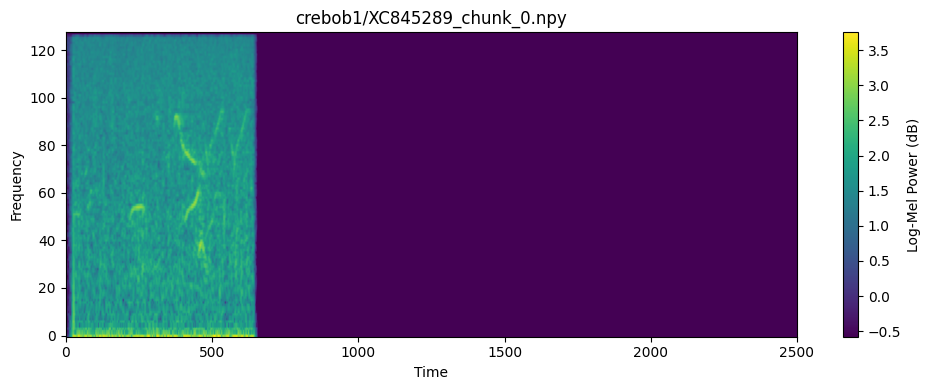

[INFO] Inspecting chunk: compau/iNat680068_chunk_0.npy
[INFO] Primary label: compau
[INFO] Visualizing spectrogram: /kaggle/working/precomputed_spectograms/compau/iNat680068_chunk_0.npy


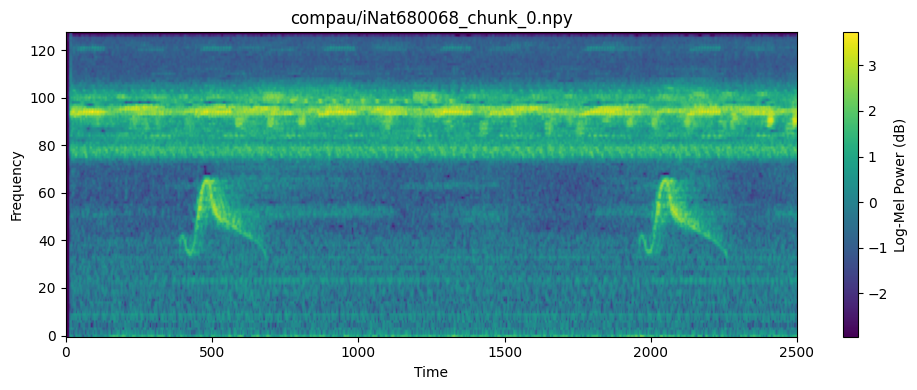

[INFO] Inspecting chunk: compau/iNat680068_chunk_1.npy
[INFO] Primary label: compau
[INFO] Visualizing spectrogram: /kaggle/working/precomputed_spectograms/compau/iNat680068_chunk_1.npy


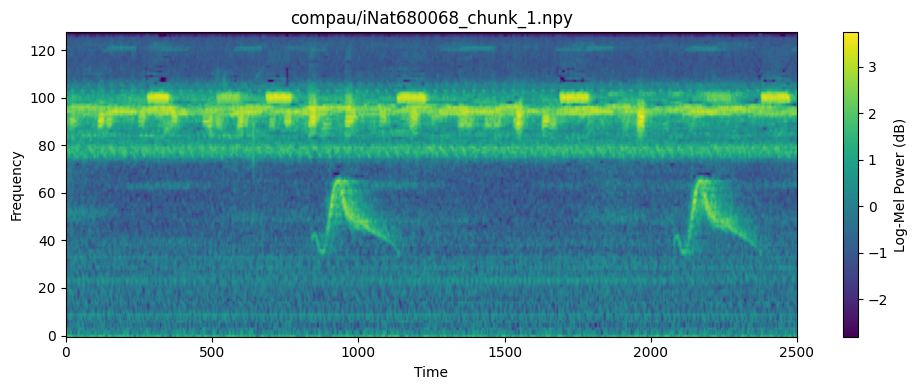

[INFO] Inspecting chunk: compau/iNat680068_chunk_2.npy
[INFO] Primary label: compau
[INFO] Visualizing spectrogram: /kaggle/working/precomputed_spectograms/compau/iNat680068_chunk_2.npy


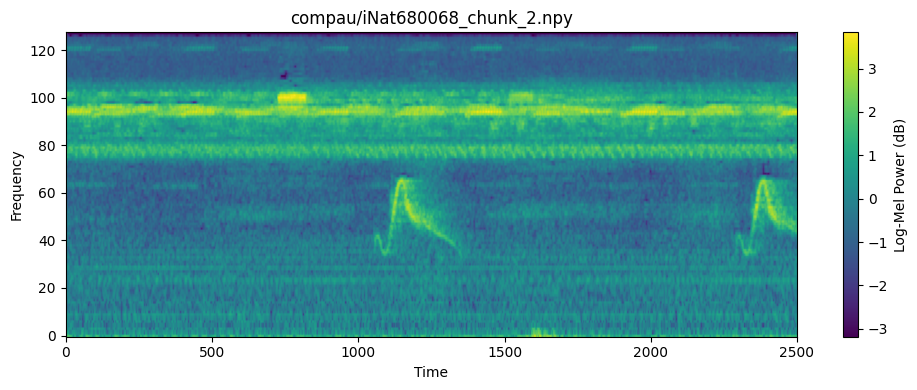

[INFO] Inspecting chunk: compau/iNat680068_chunk_3.npy
[INFO] Primary label: compau
[INFO] Visualizing spectrogram: /kaggle/working/precomputed_spectograms/compau/iNat680068_chunk_3.npy


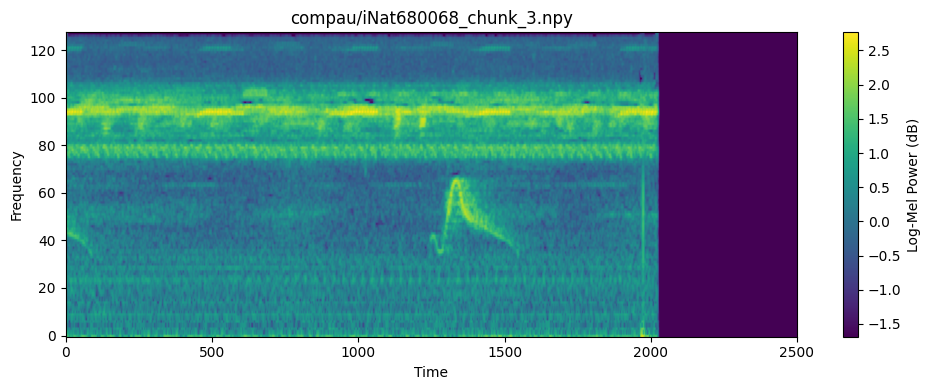

In [37]:
# --- Initialize Preprocessor ---
preprocessor = SpectrogramPreprocessor(cfg, num_workers=1)

# Load training metadata
train_df = pd.read_csv(cfg.metadata_path)
# --- Select random samples for testing ---
# sample_files = random.sample(list(train_df.filename), 3)
n = 3
sample_files_idx = random.sample(range(len(train_df)), n)
sample_files = train_df.iloc[sample_files_idx]["filename"].tolist()
secondary_labels = train_df.iloc[sample_files_idx]["secondary_labels"].tolist()
ratings = train_df.iloc[sample_files_idx]["rating"].tolist()

for i in range(n):
    print(f"[INFO] Selected sample: {sample_files[i]} -> Respective secondary label: {secondary_labels[i]}")

get_audio_sample(train_df, cfg.train_data_path, filename=sample_files[0])
get_audio_sample(train_df, cfg.train_data_path, filename=sample_files[1])
get_audio_sample(train_df, cfg.train_data_path, filename=sample_files[2])

# --- Preprocess files ---
processed_metadata = []
for file, rating in zip(sample_files, ratings):
    metadata = preprocessor.preprocess_file(file, rating)
    if metadata:
        processed_metadata.extend(metadata)
        
# --- Visualization and Inspection ---
def visualize_spectrogram(path, title="Spectrogram"):
    """
    Visualize a saved spectrogram from .npy
    """
    print(f"[INFO] Visualizing spectrogram: {path}")
    spectrogram = np.load(path)
    plt.figure(figsize=(10, 4))
    plt.imshow(spectrogram, aspect='auto', origin='lower')
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Frequency")
    plt.colorbar(label="Log-Mel Power (dB)")
    plt.tight_layout()
    plt.show()


def inspect_chunks(metadata, precompute_dir):
    """
    Display chunks and analyze voice presence.
    """
    print(len(metadata))
    for chunk_name, _, primary_label in metadata:
        
        chunk_path = os.path.join(precompute_dir, chunk_name)
        print(f"[INFO] Inspecting chunk: {chunk_name}")
        print(f"[INFO] Primary label: {primary_label}")
        if os.path.exists(chunk_path):
            visualize_spectrogram(chunk_path, title=chunk_name)
        else:
            print(f"[WARNING] File not found: {chunk_path}")

# --- Run inspection ---
print(f"[INFO] Total chunks processed: {len(processed_metadata)}")
inspect_chunks(processed_metadata, cfg.spectogram_dir)


In [ ]:
# Initialize preprocessor
preprocessor = SpectrogramPreprocessor(cfg)

# Load training metadata
train_df = pd.read_csv(cfg.metadata_path)

# Get all filenames and ratings
all_files = [(row.filename, row.rating) for _, row in train_df.iterrows() if row.filename.endswith(".ogg")]

# Start precomputation
print("[INFO] Starting spectrogram pre-computation...")
preprocessor.preprocess_all_files(all_files)


[INFO] Starting spectrogram pre-computation...
[INFO] Parallel processing 28564 files...
[INFO] Voice Activity Detection enabled, filtering human voice and silence...


Pre-computing spectograms:   0%|          | 0/28564 [00:00<?, ?it/s]

Using cache found in /root/.cache/torch/hub/snakers4_silero-vad_master
Using cache found in /root/.cache/torch/hub/snakers4_silero-vad_master
Using cache found in /root/.cache/torch/hub/snakers4_silero-vad_master
Using cache found in /root/.cache/torch/hub/snakers4_silero-vad_master


[INFO] Silero VAD model loaded successfully in worker process.
[INFO] Silero VAD model loaded successfully in worker process.
[INFO] Silero VAD model loaded successfully in worker process.
[INFO] Silero VAD model loaded successfully in worker process.
